# Clearwater National Forest region#2

## Load *Streamlines* package

In [1]:
import streamlines

## Initiate *Streamlines* workflow

Choose the JSON parameters file we want to work with. The extension `.json` is automatically added.

In [2]:
JSON_parameters_file = 'ClearwaterNF2'

Initialize streamline analysis.

In [3]:
sl = streamlines.run( parameters_file=JSON_parameters_file, \
                        do_geodata = False, \
                        do_preprocess = False, \
                        do_condition=True, \
                        do_trace = False, \
                        do_analysis=False, \
                        do_mapping=False, \
                        do_plot=False, \
                        do_display=True, \
                        do_save=False )


Sat 2018-08-11 09:28:00 JST+0900

**Initialization begin**
Loaded JSON parameters file "/Users/colinstark/Work/Streamlines/slm/json/ClearwaterNF2.json"
slm git:
[['commit f74a16d68d646db442ad3e1cb3a001212cba02a9',
  'Author: Colin Stark',
  'Date:   Fri Jul 27 20:12:42 2018 +0900',
  '    Mostly implemented FMM measurement of HSL']]
slmnb git:
[['commit ccd1021bece27428fe55ca122aea285a89787f08',
  'Author: Colin Stark',
  'Date:   Tue Jun 26 20:06:54 2018 +0900',
  '    Self sync: Big "bug" fixes: ch mapping, ridges & masking, HSL distbn"']]
slmdata git:
[['commit ebec4d15fce4f5291086f119daf4b4e8f842d9fb',
  'Author: Colin Stark',
  'Date:   Mon May 14 19:27:53 2018 +0900',
  '    Add Ikawa ROI; replace Gabilan DTMs w pit filled']]
**Initialization end**



## Import DTM

In [4]:
sl.geodata.do()


**Geodata begin**
Reading DTM from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/ClearwaterNF/ClearwaterNF2_res2m_fillsinks0p01deg.tif"
(672000.0, 2.0, 0.0, 5165000.0, 0.0, -2.0)
DTM size: 4000 x 2500 = 10,000,000 pixels
DTM pixel size: 2.0m
DTM origin:
  - bottom-left pixel center: [672000.00mE, 5160000.00mN]
  - bottom-left pixel corner: [671999.00mE, 5159999.00mN]


ERROR 1: NUMPY driver was compiled against GDAL 2.2, but the current library version is 2.4


ROI pixel bounds:  [[0, 3999], [0, 2499]]
ROI pixel grid:  4000 x 2500 = 10,000,000 pixels
ROI pixel-edge boundaries (assuming pixel-as-area)
  - in pixel units: [x: 0.0<=>4000.0] , [y: 0.0<=>2500.0]
  - in meters:      [x: 0.0<=>8000.0] , [y: 0.0<=>5000.0]
Reading basins from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/ClearwaterNF/ClearwaterNF2_res2m_fill0p01deg_basins.tif"
(672000.0, 2.0, 0.0, 5165000.0, 0.0, -2.0)
Mask out all but basin numbers [920]
**Geodata end**



Recording figure "roi_shaded_relief"


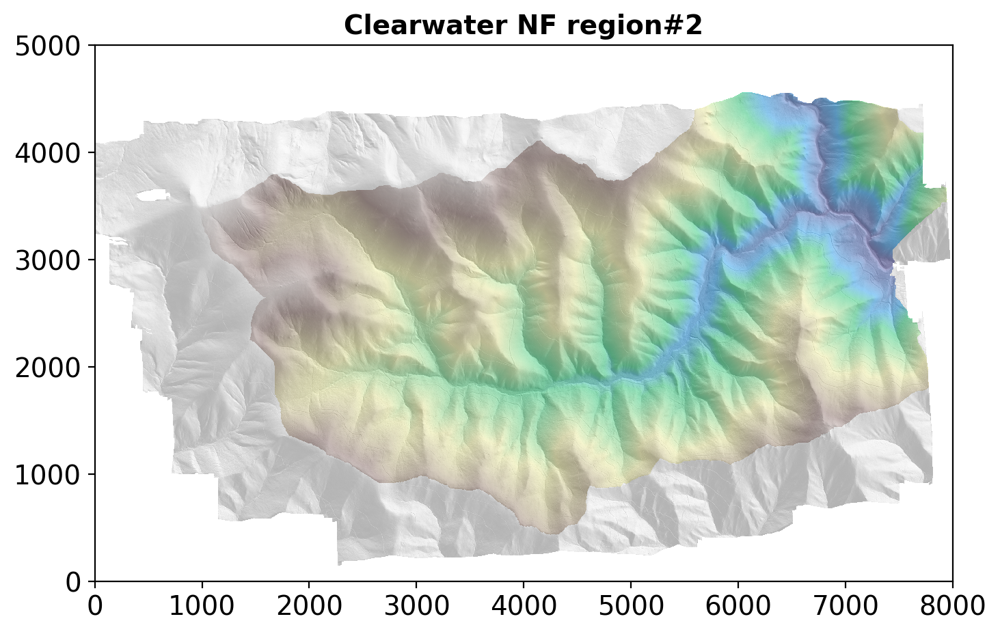

In [5]:
sl.plot.plot_roi_shaded_relief(interp_method='none')

## Preprocess DTM (fix loops etc)

In [6]:
%time sl.preprocess.do()


**Preprocess begin**
Precondition gradient vector field by fixing loops & blockages
Finding blockages...found 3269...done
Finding and fixing loops...
...done
Fixing blockages...
...done
Mask out bad uv pixels...done
**Preprocess end**

CPU times: user 28.6 s, sys: 662 ms, total: 29.3 s
Wall time: 29.2 s


In [7]:
# sl.plot.plot_classical_streamlines_and_vectors()

## Trace streamlines

In [8]:
%autosave 0
%time sl.trace.do()
%autosave 120

Autosave disabled

**Trace begin**
Integrating trajectories...
Generating seed points...shuffling...padding for 32 CL work items/group: 1000->1024...done
GPU/OpenCL device global memory limit for streamline trajectories: 3.6GB
GPU/OpenCL device memory required for streamline trajectories: 4MB => no need to chunkify
Total number of kernel instances: 1,024
Number of chunks = seed point array divisor: 1
Chunk size = number of kernel instances per chunk: 1,024
Downstream: downup=0 sgn(uv)=+1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Upstream:   downup=1 sgn(uv)=-1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Building streamlines compressed array
Streamlines actual array allocation:  size=2MB
Computing streamlines statistics
   downstream                            upstream                          
          min         mean          max       min         mean          max
l    1.259439   974.670

Autosaving every 120 seconds


In [9]:
import pandas as pd
ddf=pd.DataFrame(sl.trace.traj_stats_df.loc['downstream'].T)
udf=pd.DataFrame(sl.trace.traj_stats_df.loc['upstream'].T)
ddf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Downstreamline statistics:')
udf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Upstreamline statistics:')

,min,mean,max
l,1.26,975,1e+03
n,2,1.31e+03,1.35e+03
ds,0.63,0.746,0.751


,min,mean,max
l,4.26,734,1e+03
n,5,1.06e+03,2e+03
ds,0.0635,0.721,0.853


Autosave disabled
Plotting all 1,000 down streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%...53%...54%...55%...56%...57%...58%...59%...60%...61%...62%...63%...64%...65%...66%...67%...68%...69%...70%...71%...72%...73%...74%...75%...76%...77%...78%...79%...80%...81%...82%...83%...84%...85%...86%...87%...88%...89%...90%...91%...92%...93%...94%...95%...96%...97%...98%...99%...100%
Plotting all 1,000 up streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%..

Autosaving every 120 seconds


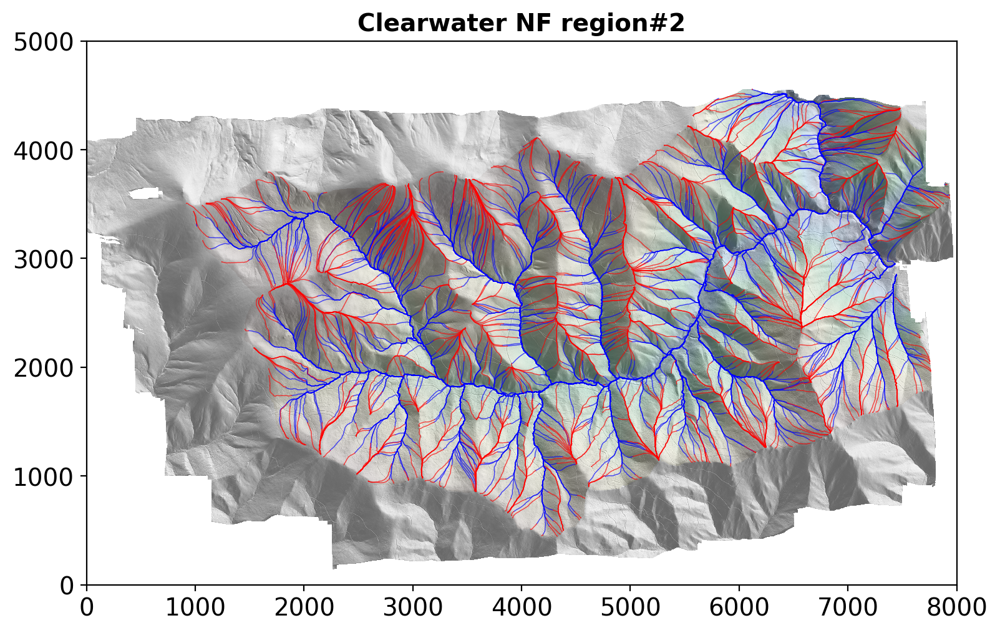

In [10]:
%autosave 0
sl.plot.plot_streamlines(window_size_factor=3)
%autosave 120

## Viz streamline flow concentrations

Recording figure "dsla"
Recording figure "dslt"


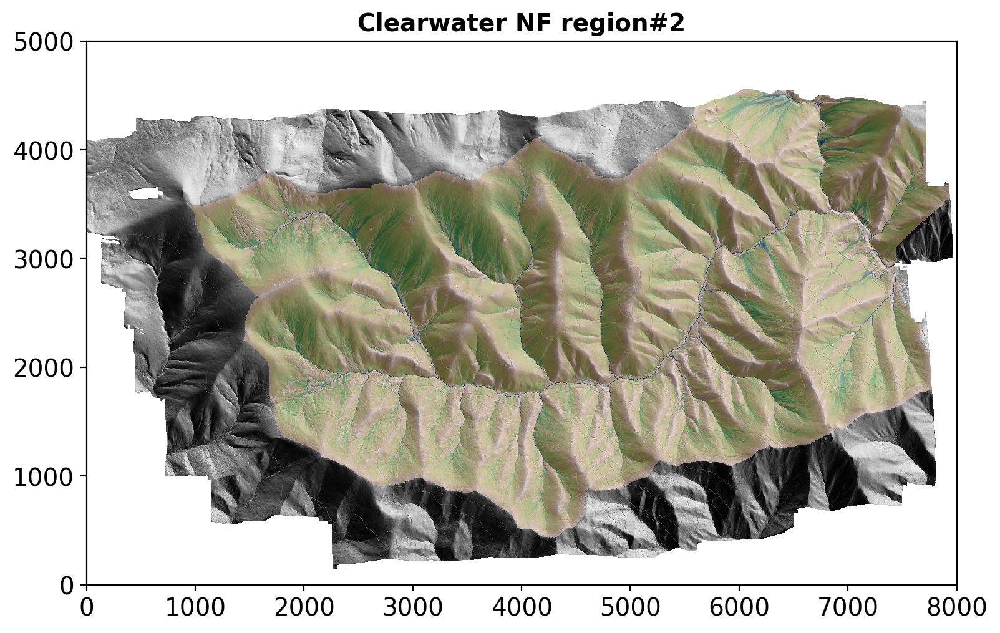

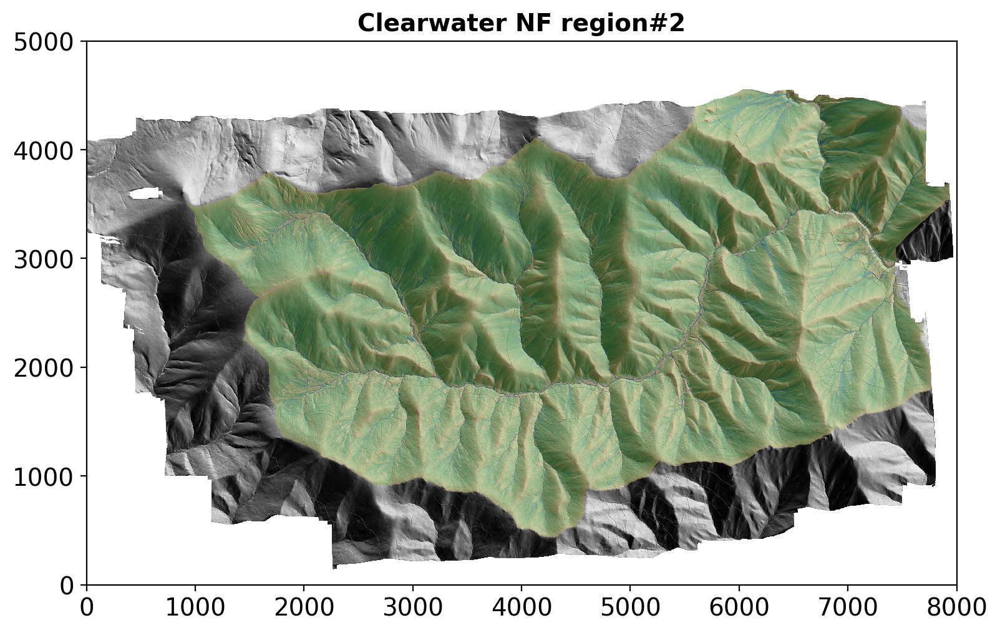

In [11]:
sl.plot.plot_flow_maps(window_size_factor=3)

## Analyze streamline distributions

In [12]:
# sl.analysis.do()

In [13]:
# sl.plot.plot_distributions()

## Map channels, segments & hillslope lengths

In [47]:
sl.mapping.pass1()


**Pass#1 begin**
Channels...done
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Labeling confluences...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Segmenting channels...number of segments=205
...done
Linking hillslopes...
...done
Segmenting hillslopes...
...done
Subsegmenting left & right flanks...number of subsegments=410
...done
Prepare for mapping HSL from midslopes
Midslopes...done
Ridges...done
**Pass#1 end**


In [48]:
sl.mapping.pass2()


**Pass#2 begin**
0.0% -205 
Channel threshold = 235.8m
FMM mean HSL   = 138.8m
Trace mean HSL = 200.8m
0.2% -204 
Channel threshold = 187.4m
FMM mean HSL   = 161.5m
Trace mean HSL = 192.8m
0.5% -203 
Channel threshold = 216.2m
FMM mean HSL   = 110.2m
Trace mean HSL = 167.0m
0.7% -202 
Channel threshold = 150.0m
FMM mean HSL   = 34.7m
Trace mean HSL = 41.1m
1.0% -201 
Channel threshold = 144.9m
FMM mean HSL   = 62.1m
Trace mean HSL = 87.3m
1.2% -200 
Channel threshold = 513.6m
FMM mean HSL   = 25.8m
Trace mean HSL = 33.9m
1.5% -199 
Channel threshold = 353.8m
FMM mean HSL   = 160.3m
Trace mean HSL = 220.7m
1.7% -198 
Channel threshold = 351.0m
FMM mean HSL   = 33.5m
Trace mean HSL = 73.4m
2.0% -197 
Channel threshold = 226.1m
FMM mean HSL   = 43.7m
Trace mean HSL = 40.2m
2.2% -196 
Channel threshold = 267.1m
FMM mean HSL   = 191.7m
Trace mean HSL = 198.9m
2.4% -195 
Channel threshold = 152.3m
FMM mean HSL   = 96.7m
Trace mean HSL = 153.3m
2.7% -194 
Channel threshold = 232.6m
FMM mean 

FMM mean HSL   = 126.6m
Trace mean HSL = 153.1m
23.7% -108 
Channel threshold = 150.0m
FMM mean HSL   = 9.3m
Trace mean HSL = 8.7m
23.9% -107 
Channel threshold = 310.4m
FMM mean HSL   = 146.9m
Trace mean HSL = 204.4m
24.1% -106 
Channel threshold = 226.9m
FMM mean HSL   = 81.1m
Trace mean HSL = 184.1m
24.4% -105 
Channel threshold = 207.6m
FMM mean HSL   = 83.7m
Trace mean HSL = 135.1m
24.6% -104 
Channel threshold = 159.0m
FMM mean HSL   = 94.7m
Trace mean HSL = 137.1m
24.9% -103 
Channel threshold = 83.0m
FMM mean HSL   = 69.3m
Trace mean HSL = 103.0m
25.1% -102 
Channel threshold = 360.8m
FMM mean HSL   = 225.9m
Trace mean HSL = 237.6m
25.4% -101 
Channel threshold = 246.3m
FMM mean HSL   = 60.4m
Trace mean HSL = 94.5m
25.6% -100 
Channel threshold = 349.6m
FMM mean HSL   = 18.0m
Trace mean HSL = 16.5m
25.9% -99 
Channel threshold = 128.4m
FMM mean HSL   = 60.2m
Trace mean HSL = 104.3m
26.1% -98 
Channel threshold = 398.3m
FMM mean HSL   = 208.5m
Trace mean HSL = 203.1m
26.3% -97 


Trace mean HSL = 166.4m
47.1% -12 
Channel threshold = 167.3m
FMM mean HSL   = 70.5m
Trace mean HSL = 140.7m
47.3% -11 
Channel threshold = 82.0m
FMM mean HSL   = 42.5m
Trace mean HSL = 70.0m
47.6% -10 
Channel threshold = 305.3m
FMM mean HSL   = 171.1m
Trace mean HSL = 264.9m
47.8% -9 
Channel threshold = 146.7m
FMM mean HSL   = 80.7m
Trace mean HSL = 154.9m
48.0% -8 
Channel threshold = 421.3m
FMM mean HSL   = 13.0m
Trace mean HSL = 12.2m
48.3% -7 
Channel threshold = 298.7m
FMM mean HSL   = 113.3m
Trace mean HSL = 250.4m
48.5% -6 
Channel threshold = 376.8m
FMM mean HSL   = 126.3m
Trace mean HSL = 253.9m
48.8% -5 
Channel threshold = 68.8m
FMM mean HSL   = 52.3m
Trace mean HSL = 70.3m
49.0% -4 
Channel threshold = 356.7m
FMM mean HSL   = 236.7m
Trace mean HSL = 333.9m
49.3% -3 
Channel threshold = 272.3m
FMM mean HSL   = 114.4m
Trace mean HSL = 184.1m
49.5% -2 
Channel threshold = 163.0m
FMM mean HSL   = 120.7m
Trace mean HSL = 170.9m
49.8% -1 
Channel threshold = 435.7m
FMM mean HS

71.0% +87 
Channel threshold = 220.4m
FMM mean HSL   = 48.2m
Trace mean HSL = 85.7m
71.2% +88 
Channel threshold = 150.0m
FMM mean HSL   = 23.0m
Trace mean HSL = 24.2m
71.5% +89 
Channel threshold = 307.0m
FMM mean HSL   = 181.8m
Trace mean HSL = 192.9m
71.7% +90 
Channel threshold = 150.0m
FMM mean HSL   = 34.8m
Trace mean HSL = 45.9m
72.0% +91 
Channel threshold = 256.7m
FMM mean HSL   = 143.0m
Trace mean HSL = 159.6m
72.2% +92 
Channel threshold = 193.6m
FMM mean HSL   = 145.6m
Trace mean HSL = 194.9m
72.4% +93 
Channel threshold = 261.0m
FMM mean HSL   = 116.4m
Trace mean HSL = 183.6m
72.7% +94 
Channel threshold = 212.5m
FMM mean HSL   = 95.8m
Trace mean HSL = 136.6m
72.9% +95 
Channel threshold = 284.1m
FMM mean HSL   = 135.0m
Trace mean HSL = 238.1m
73.2% +96 
Channel threshold = 170.3m
FMM mean HSL   = 54.5m
Trace mean HSL = 68.8m
73.4% +97 
Channel threshold = 204.4m
FMM mean HSL   = 107.1m
Trace mean HSL = 133.1m
73.7% +98 
Channel threshold = 246.4m
FMM mean HSL   = 91.6m
Tr

Trace mean HSL = 212.7m
94.6% +184 
Channel threshold = 336.7m
FMM mean HSL   = 148.8m
Trace mean HSL = 187.0m
94.9% +185 
Channel threshold = 137.0m
FMM mean HSL   = 56.5m
Trace mean HSL = 102.3m
95.1% +186 
Channel threshold = 150.0m
FMM mean HSL   = 8.3m
Trace mean HSL = 8.5m
95.4% +187 
Channel threshold = 150.0m
FMM mean HSL   = 41.2m
Trace mean HSL = 43.1m
95.6% +188 
Channel threshold = 150.4m
FMM mean HSL   = 46.6m
Trace mean HSL = 124.2m
95.9% +189 
Channel threshold = 325.0m
FMM mean HSL   = 172.9m
Trace mean HSL = 240.4m
96.1% +190 
Channel threshold = 61.9m
FMM mean HSL   = 49.2m
Trace mean HSL = 64.0m
96.3% +191 
Channel threshold = 586.3m
FMM mean HSL   = 33.4m
Trace mean HSL = 38.5m
96.6% +192 
Channel threshold = 527.9m
FMM mean HSL   = 15.0m
Trace mean HSL = 14.9m
96.8% +193 
Channel threshold = 116.3m
FMM mean HSL   = 81.3m
Trace mean HSL = 131.3m
97.1% +194 
Channel threshold = 135.5m
FMM mean HSL   = 46.7m
Trace mean HSL = 83.4m
97.3% +195 
Channel threshold = 146.4

In [49]:
sl.mapping.pass3()


**Pass#3 begin**
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Mapping hillslope lengths from midslopes...dilation with 51m (25-pixel) width filter...mean filtering with 60m (30-pixel) diameter disk...done
Computing hillslope aspect with median filter radii 4m (slope), 50m (uv)...done
Computing hillslope length-aspect function...done
Computing hillslope length-aspect statistics...done
**Pass#3 end**


## Viz channels & segments

Recording figure "channels"
Recording figure "label"


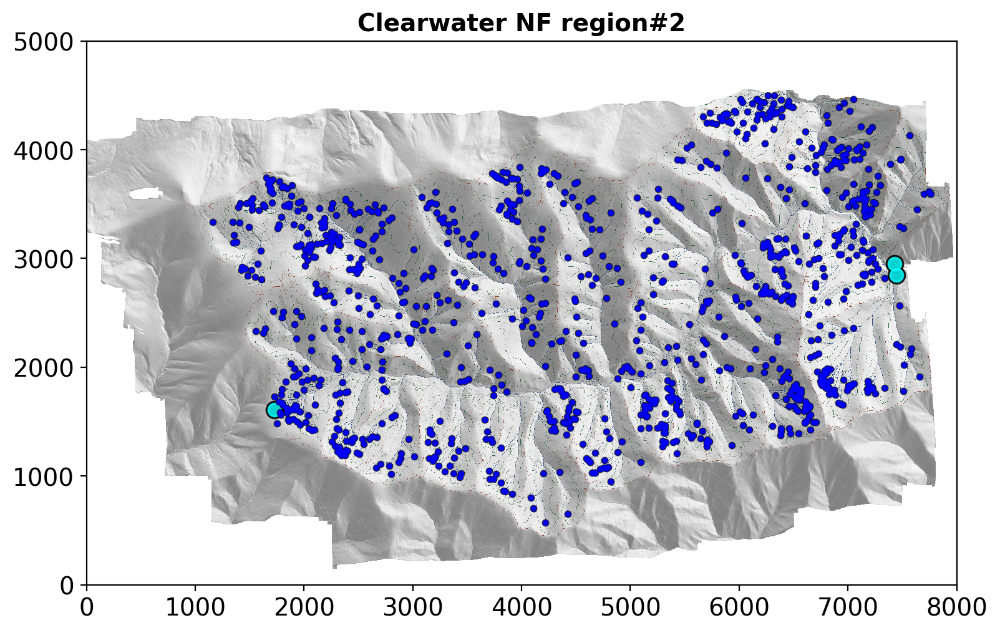

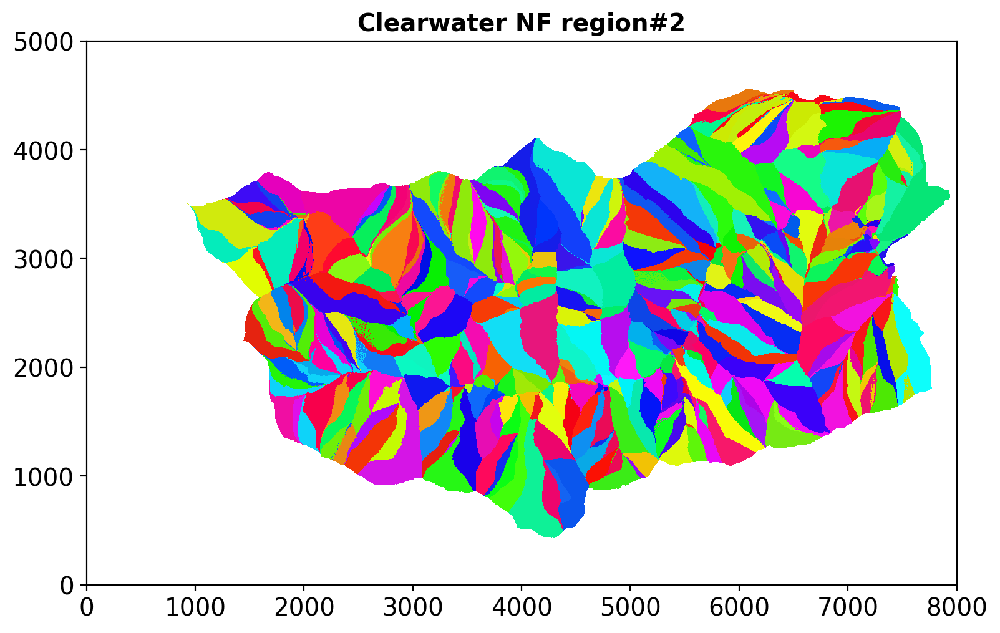

In [50]:
sl.plot.plot_channels(window_size_factor=3)
sl.plot.plot_segments(window_size_factor=3)

## Viz hillslope lengths

In [60]:
pctile=0.5
sl.plot.hsl_z_min=pctile
sl.plot.hsl_z_pctile=100-pctile
sl.plot.contour_hsl_z_min=pctile
sl.plot.contour_hsl_z_pctile=100-pctile

Recording figure "hsl"


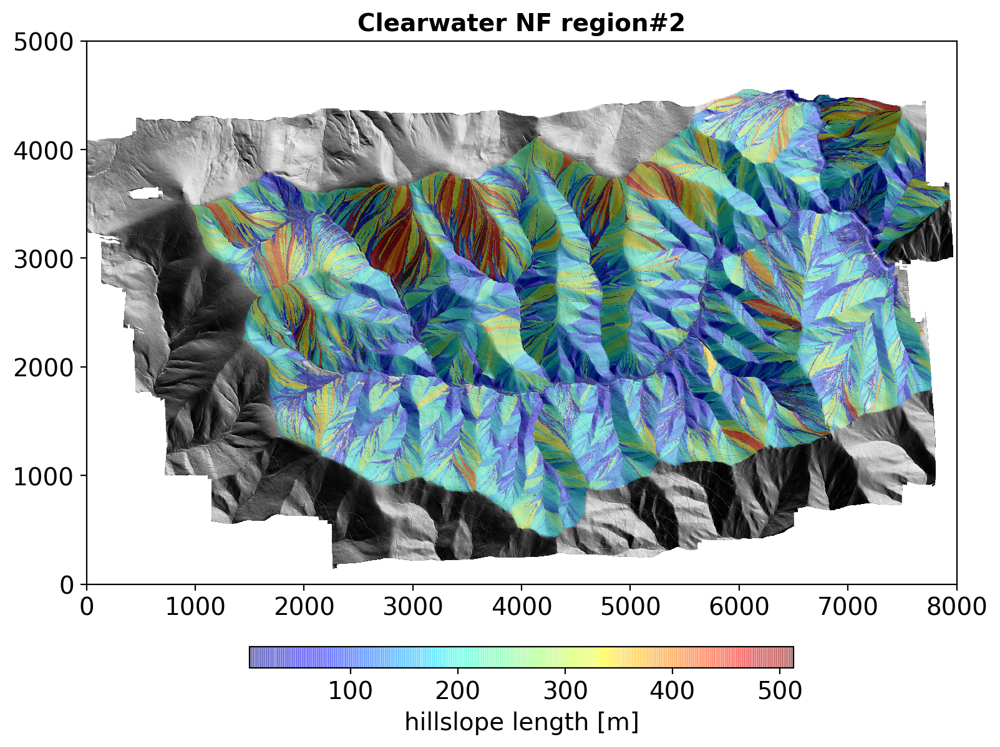

In [61]:
sl.plot.plot_hsl(window_size_factor=3)

Recording figure "hsl_contours"


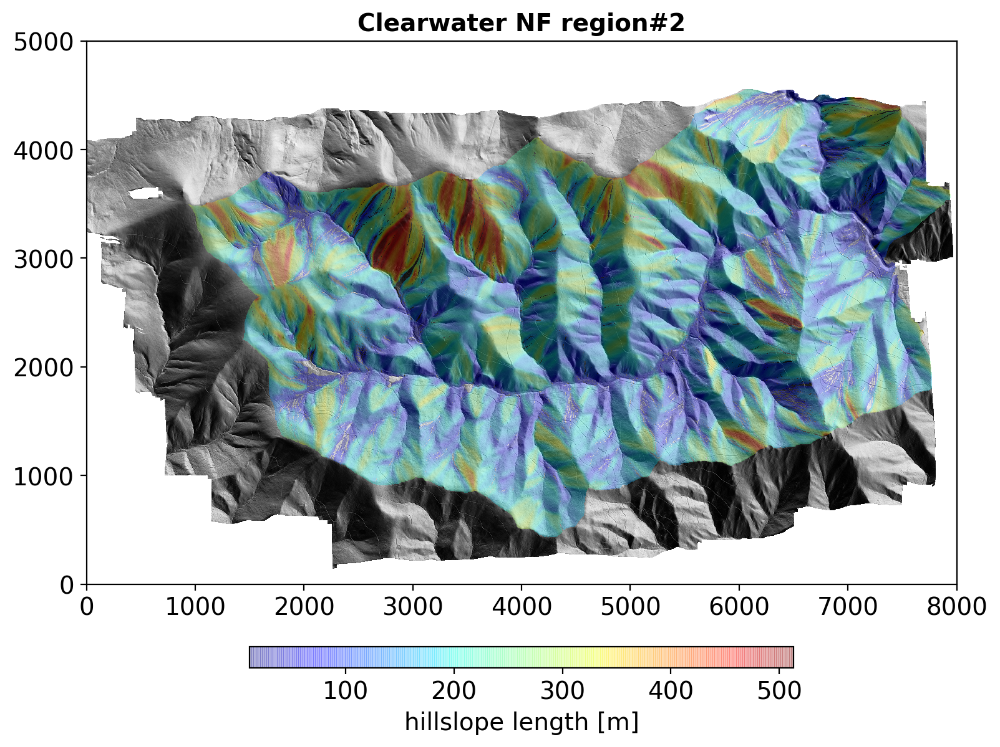

In [62]:
sl.plot.plot_hsl_contoured(window_size_factor=3)

## Viz aspect, hillslope length

Recording figure "aspect"


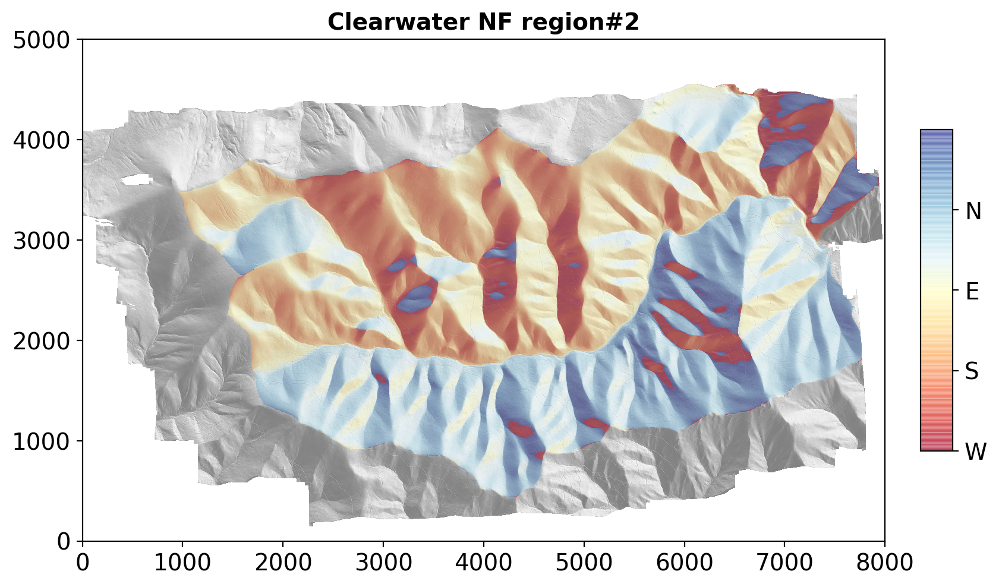

In [53]:
sl.plot.plot_aspect(window_size_factor=3.15)

In [39]:
sl.mapping.check_hsl_ns_disparity()

HSL mean ± σ(split), σ(all):	      189.1m ± 18.5m (split) 28.1m (all)
HSL N-S disparity:		      171.0mN vs 206.6mS   ∆≈35.6m
HSL N-S rel disparity vs variation:   18.8% (35.6m) NS vs 9.8% (18.5m)
HSL N-S disparity signal-noise ratio: ∆/σ = 1.9
					=> moderate south bias
N-facing vs S-facing HSL distribution comparison tests
  for f(HSL_N,S) with N,S bounds 45°<|±aspect|<135° from east
D_alpha =  c(alpha)*0.00687769
Kolmogorov-Smirnov: 0.17 p=0
Mann-Whitney:       0.39 p=0
Rank-sum:           -53.3 p=0
Student's t:        -57.7 p=0
Welch:              -58.5 p=0
P-P:                -33%


Recording figure "hsl_aspect_distribution"


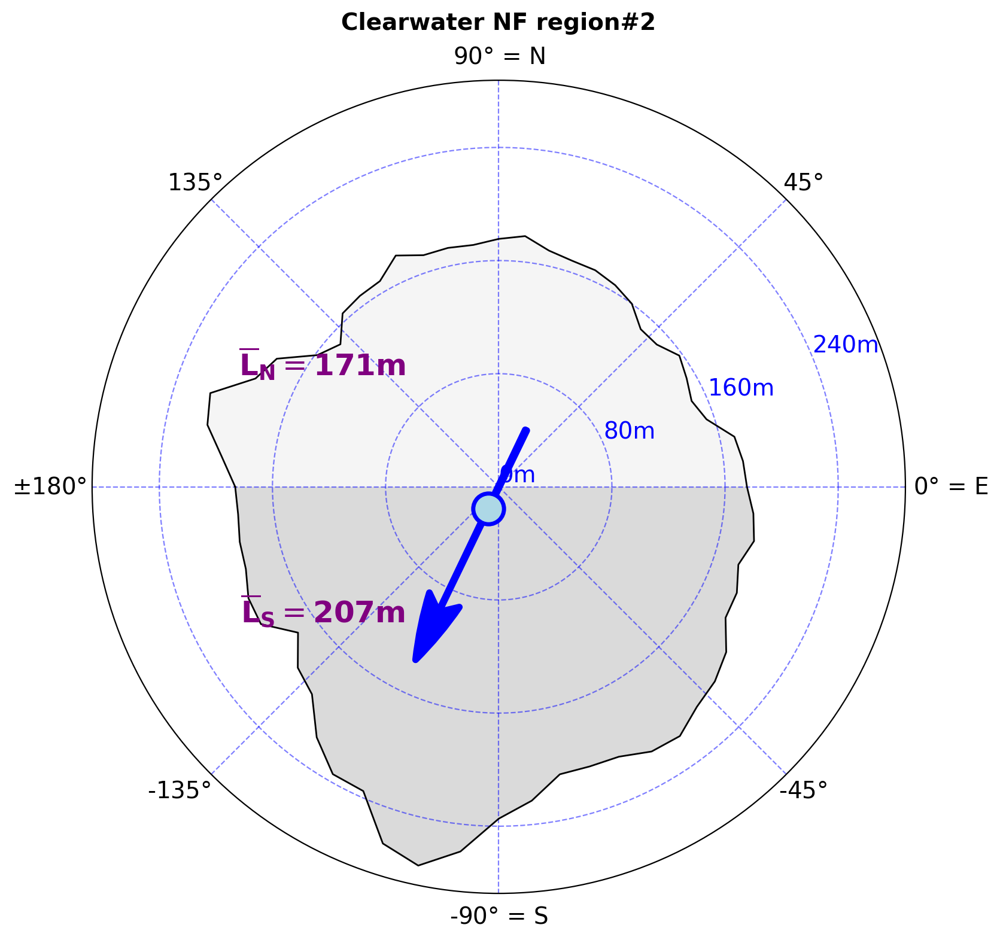

In [40]:
sl.plot.plot_hsl_aspect_distribution(window_size_factor=3)

## Hillslope length stats

Plotting hillslope length distributions...
Recording figure "hsl_nsall_distbn"
Recording figure "hsl_ns_qq"
Recording figure "hsl_ns_pp"


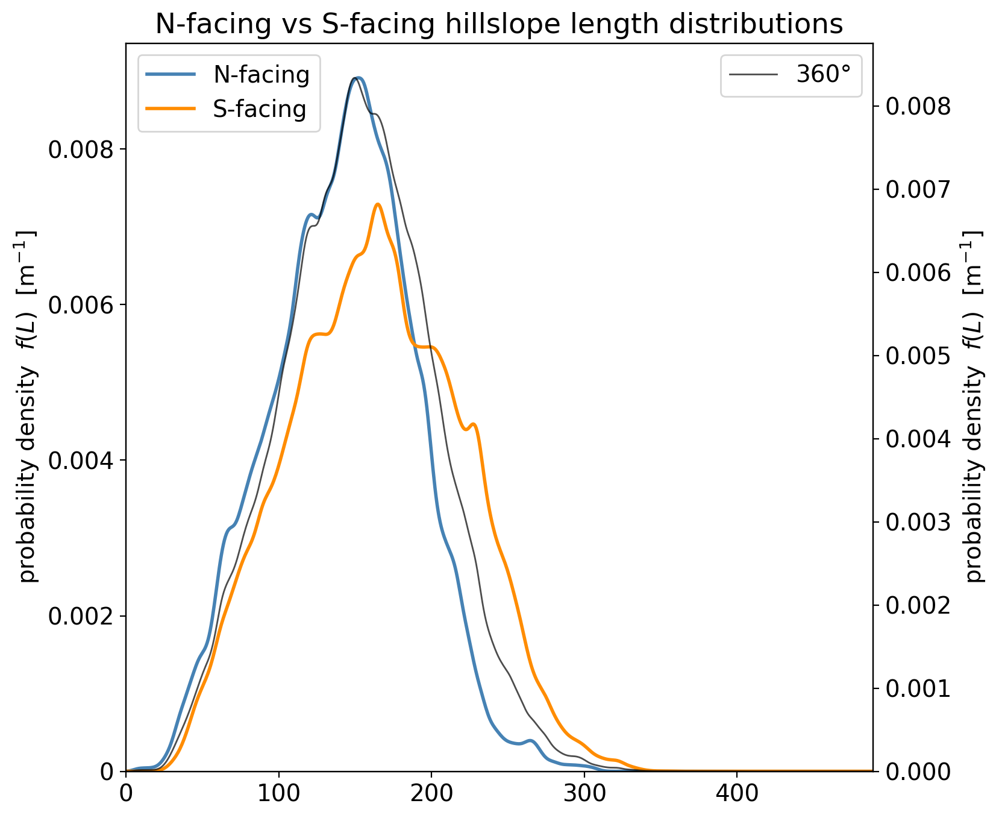

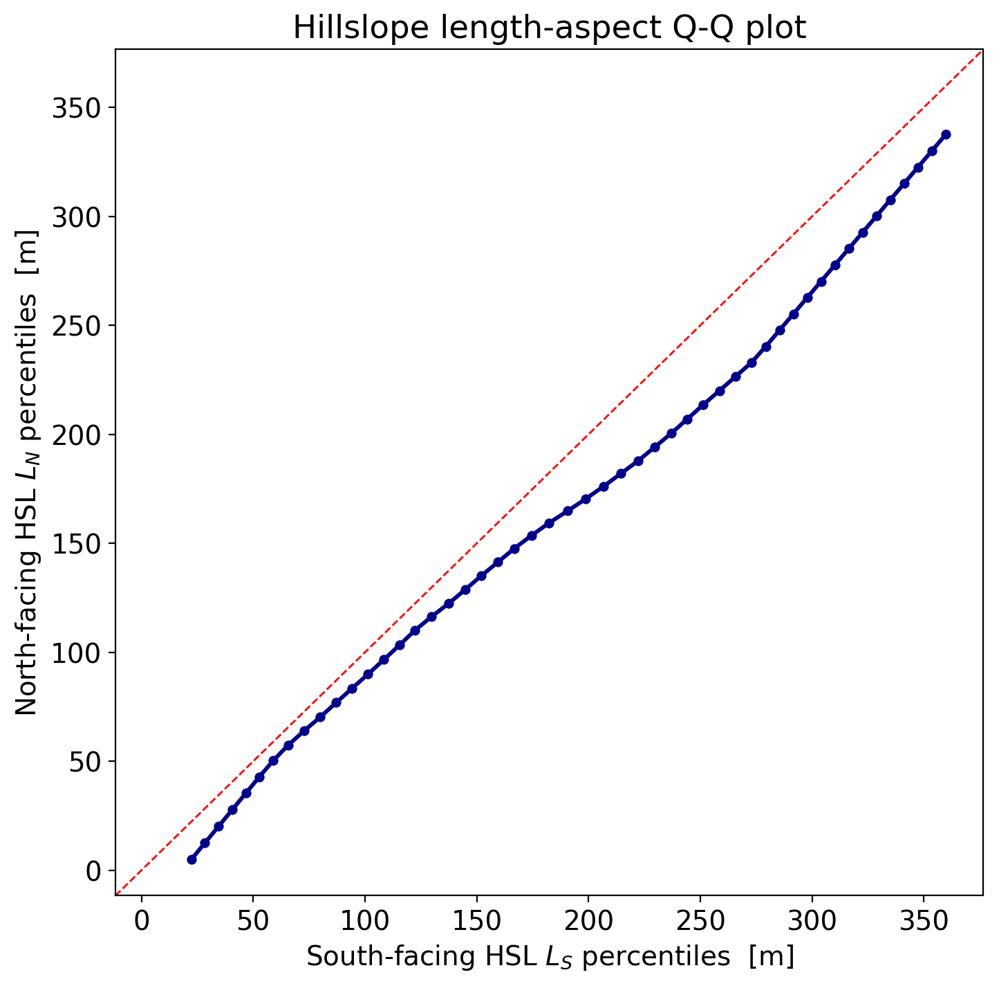

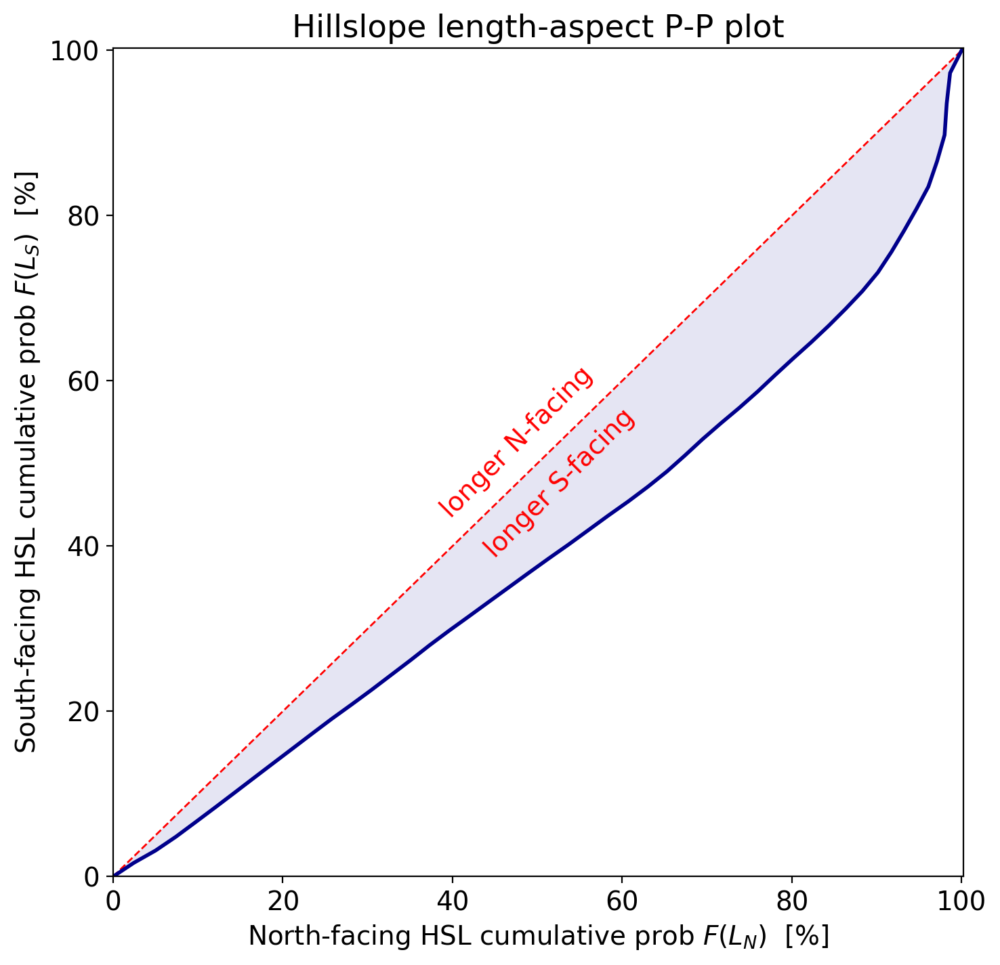

In [23]:
sl.plot.plot_hsl_distributions()

In [24]:
df = sl.mapping.hsl_stats_df
df[:30].style.format("{:.3g}").set_properties(**{'font-size':'140%'}) \
         .set_caption('Hillslope length statistics:')
df.mean()

,,count,mean [m],stddev [m]
fine,coarse,,,


count        NaN
mean [m]     NaN
stddev [m]   NaN
dtype: float64

## Export plots

In [25]:
sl.plot.figs

{'roi_shaded_relief': <Figure size 810x810 with 1 Axes>,
 'streamlines': <Figure size 900x900 with 1 Axes>,
 'dsla': <Figure size 900x900 with 1 Axes>,
 'dslt': <Figure size 900x900 with 1 Axes>,
 'channels': <Figure size 900x900 with 1 Axes>,
 'label': <Figure size 900x900 with 1 Axes>,
 'hsl': <Figure size 900x900 with 2 Axes>,
 'hsl_contours': <Figure size 900x900 with 2 Axes>,
 'aspect': <Figure size 945x945 with 2 Axes>,
 'hsl_aspect_distribution': <Figure size 900x900 with 1 Axes>,
 'hsl_nsall_distbn': <Figure size 800x800 with 2 Axes>,
 'hsl_ns_qq': <Figure size 810x810 with 1 Axes>,
 'hsl_ns_pp': <Figure size 810x810 with 1 Axes>}

In [26]:
sl.save.do()


**Write results to files begin**
Saving maps...
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_dtm_mask.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_basin_mask.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_uv.tif (4004, 2504, 2)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_slope.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_mapping.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_coarse_subsegment.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_merged_coarse_mask.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_hsl.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_hsl_smoothed.tif (4004, 2504)
/Users/colinstark/Work/Streamlines/slmxpt/ClearwaterNF2/ClearwaterNF2_aspe